<a href="https://colab.research.google.com/github/miko-sri25/Fake-News-Detection---SVM/blob/main/SVM(MP)(D3).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np 
import pandas as pd 
import os

In [ ]:
from google.colab import files
files.upload()

Saving news_articles.csv to news_articles.csv


{'news_articles.csv': b'author,published,title,text,language,site_url,main_img_url,type,label,title_without_stopwords,text_without_stopwords,hasImage\r\nBarracuda Brigade,2016-10-26T21:41:00.000+03:00,muslims busted they stole millions in govt benefits,"print they should pay all the back all the money plus interest the entire family and everyone who came in with them need to be deported asap why did it take two years to bust them \nhere we go again another group stealing from the government and taxpayers a group of somalis stole over four million in government benefits over just  months \nweve reported on numerous cases like this one where the muslim refugeesimmigrants commit fraud by scamming our systemits way out of control more related",english,100percentfedup.com,http://bb4sp.com/wp-content/uploads/2016/10/Fullscreen-capture-10262016-83501-AM.bmp.jpg,bias,Real,muslims busted stole millions govt benefits,print pay back money plus interest entire family everyone came need deported as

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
fk=pd.read_csv('news_articles.csv')
fk

,author,published,title,text,language,site_url,main_img_url,type,label,title_without_stopwords,text_without_stopwords,hasImage
0,Barracuda Brigade,2016-10-26T21:41:00.000+03:00,muslims busted they stole millions in govt ben...,print they should pay all the back all the mon...,english,100percentfedup.com,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,bias,Real,muslims busted stole millions govt benefits,print pay back money plus interest entire fami...,1.0
1,reasoning with facts,2016-10-29T08:47:11.259+03:00,re why did attorney general loretta lynch plea...,why did attorney general loretta lynch plead t...,english,100percentfedup.com,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,bias,Real,attorney general loretta lynch plead fifth,attorney general loretta lynch plead fifth bar...,1.0
2,Barracuda Brigade,2016-10-31T01:41:49.479+02:00,breaking weiner cooperating with fbi on hillar...,red state \nfox news sunday reported this mor...,english,100percentfedup.com,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,bias,Real,breaking weiner cooperating fbi hillary email ...,red state fox news sunday reported morning ant...,1.0
3,Fed Up,2016-11-01T05:22:00.000+02:00,pin drop speech by father of daughter kidnappe...,email kayla mueller was a prisoner and torture...,english,100percentfedup.com,http://100percentfedup.com/wp-content/uploads/...,bias,Real,pin drop speech father daughter kidnapped kill...,email kayla mueller prisoner tortured isis cha...,1.0
4,Fed Up,2016-11-01T21:56:00.000+02:00,fantastic trumps point plan to reform healthc...,email healthcare reform to make america great ...,english,100percentfedup.com,http://100percentfedup.com/wp-content/uploads/...,bias,Real,fantastic trumps point plan reform healthcare ...,email healthcare reform make america great sin...,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2091,-NO AUTHOR-,2016-10-27T15:36:10.573+03:00,teens walk free after gangrape conviction,NaN,english,wnd.com,http://www.wnd.com/files/2016/10/hillary_haunt...,bias,Real,good samaritan wearing indian headdress disarm...,NaN,1.0
2092,-NO AUTHOR-,2016-10-27T15:36:10.671+03:00,school named for munichmassacre mastermind,NaN,english,wnd.com,http://www.wnd.com/files/2016/10/rambo_richard...,bias,Real,skype sex scam fortune built shame,NaN,1.0
2093,-NO AUTHOR-,2016-10-27T13:30:00.000+03:00,russia unveils satan missile,NaN,english,wnd.com,http://www.wnd.com/files/2016/10/skype_sex_sca...,bs,Fake,cannabis aficionados develop thca crystalline ...,NaN,1.0
2094,-NO AUTHOR-,2016-10-27T15:58:41.935+03:00,check out hillarythemed haunted house,NaN,english,wnd.com,http://worldtruth.tv/wp-content/uploads/2016/1...,bs,Fake,title,NaN,0.0


In [ ]:
fk['label'] = pd.factorize(fk['label'])[0].astype(np.int64)
fk

,author,published,title,text,language,site_url,main_img_url,type,label,title_without_stopwords,text_without_stopwords,hasImage
0,Barracuda Brigade,2016-10-26T21:41:00.000+03:00,muslims busted they stole millions in govt ben...,print they should pay all the back all the mon...,english,100percentfedup.com,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,bias,0,muslims busted stole millions govt benefits,print pay back money plus interest entire fami...,1.0
1,reasoning with facts,2016-10-29T08:47:11.259+03:00,re why did attorney general loretta lynch plea...,why did attorney general loretta lynch plead t...,english,100percentfedup.com,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,bias,0,attorney general loretta lynch plead fifth,attorney general loretta lynch plead fifth bar...,1.0
2,Barracuda Brigade,2016-10-31T01:41:49.479+02:00,breaking weiner cooperating with fbi on hillar...,red state \nfox news sunday reported this mor...,english,100percentfedup.com,http://bb4sp.com/wp-content/uploads/2016/10/Fu...,bias,0,breaking weiner cooperating fbi hillary email ...,red state fox news sunday reported morning ant...,1.0
3,Fed Up,2016-11-01T05:22:00.000+02:00,pin drop speech by father of daughter kidnappe...,email kayla mueller was a prisoner and torture...,english,100percentfedup.com,http://100percentfedup.com/wp-content/uploads/...,bias,0,pin drop speech father daughter kidnapped kill...,email kayla mueller prisoner tortured isis cha...,1.0
4,Fed Up,2016-11-01T21:56:00.000+02:00,fantastic trumps point plan to reform healthc...,email healthcare reform to make america great ...,english,100percentfedup.com,http://100percentfedup.com/wp-content/uploads/...,bias,0,fantastic trumps point plan reform healthcare ...,email healthcare reform make america great sin...,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2091,-NO AUTHOR-,2016-10-27T15:36:10.573+03:00,teens walk free after gangrape conviction,NaN,english,wnd.com,http://www.wnd.com/files/2016/10/hillary_haunt...,bias,0,good samaritan wearing indian headdress disarm...,NaN,1.0
2092,-NO AUTHOR-,2016-10-27T15:36:10.671+03:00,school named for munichmassacre mastermind,NaN,english,wnd.com,http://www.wnd.com/files/2016/10/rambo_richard...,bias,0,skype sex scam fortune built shame,NaN,1.0
2093,-NO AUTHOR-,2016-10-27T13:30:00.000+03:00,russia unveils satan missile,NaN,english,wnd.com,http://www.wnd.com/files/2016/10/skype_sex_sca...,bs,1,cannabis aficionados develop thca crystalline ...,NaN,1.0
2094,-NO AUTHOR-,2016-10-27T15:58:41.935+03:00,check out hillarythemed haunted house,NaN,english,wnd.com,http://worldtruth.tv/wp-content/uploads/2016/1...,bs,1,title,NaN,0.0


In [ ]:
fk=fk.drop(['site_url', 'main_img_url', 'published', 'hasImage'], axis=1)
fk=fk.dropna()
fk.head()

,author,title,text,language,type,label,title_without_stopwords,text_without_stopwords
0,Barracuda Brigade,muslims busted they stole millions in govt ben...,print they should pay all the back all the mon...,english,bias,0,muslims busted stole millions govt benefits,print pay back money plus interest entire fami...
1,reasoning with facts,re why did attorney general loretta lynch plea...,why did attorney general loretta lynch plead t...,english,bias,0,attorney general loretta lynch plead fifth,attorney general loretta lynch plead fifth bar...
2,Barracuda Brigade,breaking weiner cooperating with fbi on hillar...,red state \nfox news sunday reported this mor...,english,bias,0,breaking weiner cooperating fbi hillary email ...,red state fox news sunday reported morning ant...
3,Fed Up,pin drop speech by father of daughter kidnappe...,email kayla mueller was a prisoner and torture...,english,bias,0,pin drop speech father daughter kidnapped kill...,email kayla mueller prisoner tortured isis cha...
4,Fed Up,fantastic trumps point plan to reform healthc...,email healthcare reform to make america great ...,english,bias,0,fantastic trumps point plan reform healthcare ...,email healthcare reform make america great sin...


In [ ]:
fk.shape

(2045, 8)

In [ ]:
fk.head()

,author,title,text,language,type,label,title_without_stopwords,text_without_stopwords
0,Barracuda Brigade,muslims busted they stole millions in govt ben...,print they should pay all the back all the mon...,english,bias,0,muslims busted stole millions govt benefits,print pay back money plus interest entire fami...
1,reasoning with facts,re why did attorney general loretta lynch plea...,why did attorney general loretta lynch plead t...,english,bias,0,attorney general loretta lynch plead fifth,attorney general loretta lynch plead fifth bar...
2,Barracuda Brigade,breaking weiner cooperating with fbi on hillar...,red state \nfox news sunday reported this mor...,english,bias,0,breaking weiner cooperating fbi hillary email ...,red state fox news sunday reported morning ant...
3,Fed Up,pin drop speech by father of daughter kidnappe...,email kayla mueller was a prisoner and torture...,english,bias,0,pin drop speech father daughter kidnapped kill...,email kayla mueller prisoner tortured isis cha...
4,Fed Up,fantastic trumps point plan to reform healthc...,email healthcare reform to make america great ...,english,bias,0,fantastic trumps point plan reform healthcare ...,email healthcare reform make america great sin...


In [ ]:
X= fk.iloc[:,:-3] .values
y= fk.iloc[:,5] .values

In [ ]:
X[0]

array(['Barracuda Brigade',
       'muslims busted they stole millions in govt benefits',
       'print they should pay all the back all the money plus interest the entire family and everyone who came in with them need to be deported asap why did it take two years to bust them \nhere we go again another group stealing from the government and taxpayers a group of somalis stole over four million in government benefits over just  months \nweve reported on numerous cases like this one where the muslim refugeesimmigrants commit fraud by scamming our systemits way out of control more related',
       'english', 'bias'], dtype=object)

In [ ]:
y[0]

0

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_features=5000)
News_body = cv.fit_transform(X[:,1]).todense()

In [ ]:
News_body

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
cv_head = CountVectorizer(max_features=5000)
News_head = cv_head.fit_transform(X[:,0]).todense()
News_head

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
X_mat = np.hstack(( News_head, News_body))

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_mat,y, test_size=0.3, random_state=0)

In [ ]:
fk.dtypes


author                     object
title                      object
text                       object
language                   object
type                       object
label                       int64
title_without_stopwords    object
text_without_stopwords     object
dtype: object

In [ ]:
from sklearn.svm import SVC
clf=SVC(kernel='linear')
clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred)

array([[178,  48],
       [ 38, 350]])

In [ ]:
Acc=(350+178)/(351+178+48+38)
Acc

0.8585365853658536

In [ ]:
Sensi=(351)/(351+48)
Sensi

0.8796992481203008

In [ ]:
Speci=(178)/(178+37)
Speci

0.827906976744186

In [ ]:
fk


,author,title,text,language,type,label,title_without_stopwords,text_without_stopwords
0,Barracuda Brigade,muslims busted they stole millions in govt ben...,print they should pay all the back all the mon...,english,bias,0,muslims busted stole millions govt benefits,print pay back money plus interest entire fami...
1,reasoning with facts,re why did attorney general loretta lynch plea...,why did attorney general loretta lynch plead t...,english,bias,0,attorney general loretta lynch plead fifth,attorney general loretta lynch plead fifth bar...
2,Barracuda Brigade,breaking weiner cooperating with fbi on hillar...,red state \nfox news sunday reported this mor...,english,bias,0,breaking weiner cooperating fbi hillary email ...,red state fox news sunday reported morning ant...
3,Fed Up,pin drop speech by father of daughter kidnappe...,email kayla mueller was a prisoner and torture...,english,bias,0,pin drop speech father daughter kidnapped kill...,email kayla mueller prisoner tortured isis cha...
4,Fed Up,fantastic trumps point plan to reform healthc...,email healthcare reform to make america great ...,english,bias,0,fantastic trumps point plan reform healthcare ...,email healthcare reform make america great sin...
...,...,...,...,...,...,...,...,...
2041,Matt Barber,why never trumpers must reconsider,prof canoes reek of genocide white privilege c...,english,bias,0,trump vs clinton risk vs disaster,check hillarythemed haunted house anticlinton ...
2042,Jane Chastain,election crossroads socialism or capitalism,teens walk free after gangrape conviction judg...,english,bias,0,gingrich slutshames megyn kelly,good samaritan wearing indian headdress disarm...
2043,Michael Brown,reasons ill vote for trump,school named for munichmassacre mastermind ter...,english,bias,0,youtube bans clintons black son,skype sex scam fortune built shame moroccan bo...
2044,Ann Coulter,our new country women and minorities hit hardest,wars and rumors of wars russia unveils satan ...,english,bias,0,wikileaks bombshells hillary need know,posted eddie skyhigh potency may scare away cr...


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Import the classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC # "Support Vector Classifier" 

from sklearn.metrics import roc_curve, roc_auc_score

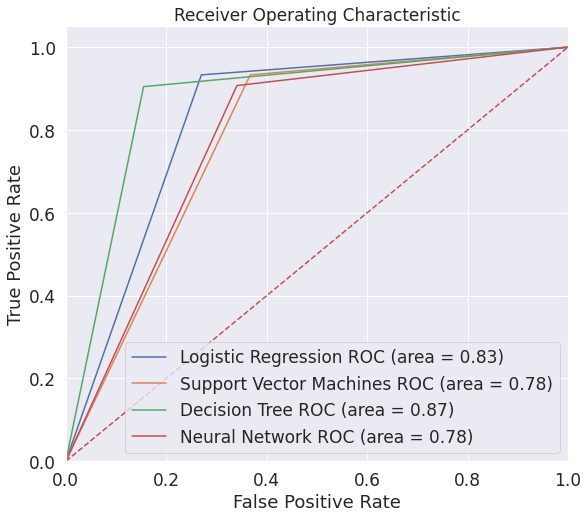

In [ ]:
from sklearn import metrics
import matplotlib.pyplot as plt

plt.figure(figsize=(9,8))

# Add the models to the list that you want to view on the ROC plot
models = [
{
    'label': 'Logistic Regression',
    'model': LogisticRegression(),
},
{
    'label': 'Support Vector Machines',
    'model': SVC(),
},
{
    'label': 'Decision Tree',
    'model': DecisionTreeClassifier(),
},
{
    'label': 'Neural Network',
    'model': MLPClassifier(),
}
]
SMALL_SIZE = 17
MEDIUM_SIZE = 18


plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=MEDIUM_SIZE)  # fontsize of the figure title
# Below for loop iterates through your models list
for m in models:
    model = m['model'] # select the model
    model.fit(X_train, y_train) # train the model
    y_pred=model.predict(X_test) # predict the test data
# Compute False postive rate, and True positive rate
    fpr, tpr, thresholds = metrics.roc_curve(y_test, model.predict(X_test))
# Calculate Area under the curve to display on the plot
    auc = metrics.roc_auc_score(y_test,model.predict(X_test))
# Now, plot the computed values
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], auc))
# Custom settings for the plot 
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()   # Display